# <center>Finding communities in social networks</center>
## <center>Unsupervised and semi-supervised clustering of friends</center>
### <center>Pavel Bogdanov - Software University</center>

### Abstract
We use unweighed undirected graphs to represent connections between people and visualize the clustering between them. Different metrics are used to compare optimal and hierarchical community detection methods. In addition, we explore a semi-supervised location-based approach with label propagation. Finally, we do graph embedding with Node2Vec and use k-means for clustering.

### Intro
Have you ever been in a situation where you introduce your work friends to your old highschool friends and you realize how different those two groups are? Even though they're both your friends, they have no common topics to talk about. Now imagine trying to plan the seating of a wedding. With each friend you consider it becomes increasingly difficult to keep track who's friends with whom and in what group he belong to. This is where unsupervised machine learning comes in. We can simply take a bunch of Facebook friendlists and let the algorithms do all the work for us.

#### Loading dependencies

In [1]:
%matplotlib inline

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
import re
import itertools
import os
import pickle
from collections import Counter


import networkx as nx
import cairocffi
from igraph.drawing.text import TextDrawer
import igraph as ig
import forceatlas2
import community
from node2vec import Node2Vec

from geopy import distance
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE

import plotly.express as px
import plotly.graph_objects as go
import ipywidgets as widgets
from ipywidgets import interact, Layout

import warnings

In [3]:
ME = 'Павел Богданов'
warnings.simplefilter('ignore')

### The Data

#### Data aquisition
You might be wondering how I aquired all of these friendlists I talk about. Does Facebook have some sort of API that allows us to do just that? It used to, but now in order to make it work you need to have an app and each of your friends needs to give permission to that app. So I must have used a scraper, right? Well yes, but actually no. If I did, I'd infringe Facebook's community standards and probably get blocked. So what, I copied all of these friendlists by hand? Yes, yes I did.

#### Reading the data
The data is in a dict-like structure with nodes and edges as keys and (list of) facebook profiles as values.

In [4]:
with open("data/friends.txt", encoding="UTF8") as file:
    friends = file.read()

In [5]:
print(friends[:130])

﻿Node

Kaloyan Nikolov

Edges

Friend
Friends
Kristiyan Draganov
35 mutual friends

Friend
Friends
Vasil Dobrev
23 mutual friends



In [6]:
my_friends_list = re.findall(r'Node\n\n(.*)', friends)
print('Count of nodes:', len(my_friends_list))
assert len(my_friends_list) == len(set(my_friends_list)), 'Duplicates detected!'

Count of nodes: 311


311 of the people in the dataset are my friends.

In [7]:
print('Count of nodes with no information:', len(re.findall(r'NA\n', friends)))

Count of nodes with no information: 177


177 of those friends didn't show their friendlist so we have no direct information about their friends.

#### Data preprocessing

Let's format the data into something more readable, like a pandas dataframe.

In [8]:
splitted_friends = re.split(r'Node\n\n(.*)', friends)
edge_dict = {}
node = None
for i in splitted_friends:
    if splitted_friends.index(i) % 2 == 1:
        node = i
    else:
        edge_dict[node] = i
print('Count of elements in dict:', len(edge_dict))

Count of elements in dict: 312


In [9]:
edge_frame = pd.DataFrame.from_dict(edge_dict, orient='index', columns=['target'])
edge_frame = edge_frame.reset_index().rename(columns={"index": "source"})
edge_frame.head()

,source,target
0,None,﻿
1,Kaloyan Nikolov,\n\nEdges\n\nFriend\nFriends\nKristiyan Dragan...
2,Калиакра Лечева,\n\nEdges\n\nFriend\nFriends\nKaloyan Nikolov\...
3,Kristiyan Draganov,\n\nEdges\n\nNA\n\n
4,Lyubov Gencheva,\n\nEdges\n\n\nFriend\nFriends\nBoris Kondev\n...


Each profile in the `target` column is separated by two new lines.

In [10]:
edge_frame = edge_frame[1::]
edge_frame.target = edge_frame.target.str.split('\n\n')
edge_frame.head()

,source,target
1,Kaloyan Nikolov,"[, Edges, Friend\nFriends\nKristiyan Draganov\..."
2,Калиакра Лечева,"[, Edges, Friend\nFriends\nKaloyan Nikolov\n71..."
3,Kristiyan Draganov,"[, Edges, NA, ]"
4,Lyubov Gencheva,"[, Edges, \nFriend\nFriends\nBoris Kondev\n2 m..."
5,Boris Kondev,"[, Edges, NA, ]"


Now we can transform the dataframe into a source-target format.

In [11]:
rows = list()
for row in edge_frame[['source', 'target']].iterrows():
    r = row[1]
    for target in r.target:
        rows.append((r.source, target))

edge_frame = pd.DataFrame(rows, columns=['source', 'target'])
edge_frame.head()

,source,target
0,Kaloyan Nikolov,
1,Kaloyan Nikolov,Edges
2,Kaloyan Nikolov,Friend\nFriends\nKristiyan Draganov\n35 mutual...
3,Kaloyan Nikolov,Friend\nFriends\nVasil Dobrev\n23 mutual friends
4,Kaloyan Nikolov,Friend\nFriends\nКалиакра Лечева\n510 friends


In [12]:
assert len(my_friends_list) == len(edge_frame.source.unique()), 'Records missmatch!'

Clean it up a little.

In [13]:
edge_frame = edge_frame[~edge_frame.target.isin(['', 'Edges', 'NA'])].reset_index(drop=True)
edge_frame.head()

,source,target
0,Kaloyan Nikolov,Friend\nFriends\nKristiyan Draganov\n35 mutual...
1,Kaloyan Nikolov,Friend\nFriends\nVasil Dobrev\n23 mutual friends
2,Kaloyan Nikolov,Friend\nFriends\nКалиакра Лечева\n510 friends
3,Kaloyan Nikolov,Friend\nFriends\nВелина Георгиева\n73 mutual f...
4,Kaloyan Nikolov,Friend\nFriends\nVonagard Cifer\n31 friends


In [14]:
len(edge_frame)

131942

There is more than just the name we can get from each profile. Every bit of information can help us in the clustering process.

In [15]:
pattern = r'(?P<relationship>Add Friend|Friend\nFriends|Friend Request Sent|Acquaintance\nFriends|Respond to Friend Request)\n\
(?P<target>.*)(?P<num_friends>\n\d*,?\d*|\n.*)?(?P<description>.*)?'

In [16]:
regex_frame = edge_frame.target.str.extractall(pattern).reset_index()
regex_frame.tail()

,level_0,match,relationship,target,num_friends,description
131665,131937,0,Add Friend,Andy Timmons,\n,University of Miami
131666,131938,0,Add Friend,Ilona Dimitrova,\n3,mutual friends
131667,131939,0,Add Friend,Rumen Stamatov,\n2,mutual friends
131668,131940,0,Add Friend,Boryana Sevdalinova Stoyanova,\n,Copywriter at Lidl Bulgaria
131669,131941,0,Add Friend,Цветелин Андреев,\n,Works at ElvenА


We can see there is a slight missmatch in the count of the original index with the new one. That means that we missed some records.

In [17]:
missed_records = edge_frame[~edge_frame.index.isin(regex_frame.level_0)]
missed_records.head()

,source,target
520,Kaloyan Nikolov,Beysim Muharem\n33 mutual friends
565,Kaloyan Nikolov,Павел Богданов\nSoftware University
1098,Калиакра Лечева,Павел Богданов\nSoftware University
1647,Lyubov Gencheva,Павел Богданов\nSoftware University
2165,Ирина Димитрова,Павел Богданов\nSoftware University


In [18]:
missed_records.count()

source    272
target    272
dtype: int64

We need to modify our regex a bit to catch these records.

In [19]:
miss_pattern = r'(?P<target>.*)\n(?P<num_friends>\d*,?\d*|\n.*)?(?P<description>.*)'
missed_records = missed_records.target.str.extractall(miss_pattern).reset_index()
missed_records.head()

,level_0,match,target,num_friends,description
0,520,0,Beysim Muharem,33,mutual friends
1,565,0,Павел Богданов,NaN,Software University
2,1098,0,Павел Богданов,NaN,Software University
3,1647,0,Павел Богданов,NaN,Software University
4,2165,0,Павел Богданов,NaN,Software University


In [20]:
combined_regex = pd.concat(objs=[regex_frame, missed_records], sort=False).reset_index(drop=True)

And now to check again if there are still records we missed.

In [21]:
miss_again = edge_frame[~edge_frame.index.isin(combined_regex.level_0)]
print('Count of missed records: ', len(miss_again))

Count of missed records:  13


That's a small enough number to be ignored so we can remove these 13 records.

In [22]:
edge_frame = edge_frame[edge_frame.index.isin(combined_regex.level_0)]
edge_frame.tail()

,source,target
131937,Делиян Маринов,Add Friend\nAndy Timmons\nUniversity of Miami
131938,Делиян Маринов,Add Friend\nIlona Dimitrova\n3 mutual friends
131939,Делиян Маринов,Add Friend\nRumen Stamatov\n2 mutual friends
131940,Делиян Маринов,Add Friend\nBoryana Sevdalinova Stoyanova\nCop...
131941,Делиян Маринов,Add Friend\nЦветелин Андреев\nWorks at ElvenА


In [23]:
combined_regex.tail()

,level_0,match,relationship,target,num_friends,description
131924,129576,0,NaN,Павел Богданов,NaN,Software University
131925,129777,0,NaN,Павел Богданов,NaN,Software University
131926,130847,0,NaN,Svetoslav Popov,NaN,Works at ЦСМП-Търговище
131927,131403,0,NaN,Павел Богданов,NaN,Software University
131928,131635,0,NaN,Adrian Lazarovski,3,mutual friends


Now they should be equal in length.

In [24]:
len(edge_frame) == len(combined_regex)

True

We can merge the two so that we can see `source` and `target` in the same dataframe.

In [25]:
edge_frame = pd.merge(left=edge_frame, right=combined_regex, left_on=edge_frame.index, right_on=combined_regex.level_0)
edge_frame.head()

,key_0,source,target_x,level_0,match,relationship,target_y,num_friends,description
0,0,Kaloyan Nikolov,Friend\nFriends\nKristiyan Draganov\n35 mutual...,0,0,Friend\nFriends,Kristiyan Draganov,\n35,mutual friends
1,1,Kaloyan Nikolov,Friend\nFriends\nVasil Dobrev\n23 mutual friends,1,0,Friend\nFriends,Vasil Dobrev,\n23,mutual friends
2,2,Kaloyan Nikolov,Friend\nFriends\nКалиакра Лечева\n510 friends,2,0,Friend\nFriends,Калиакра Лечева,\n510,friends
3,3,Kaloyan Nikolov,Friend\nFriends\nВелина Георгиева\n73 mutual f...,3,0,Friend\nFriends,Велина Георгиева,\n73,mutual friends
4,4,Kaloyan Nikolov,Friend\nFriends\nVonagard Cifer\n31 friends,4,0,Friend\nFriends,Vonagard Cifer,\n31,friends


Drop unused columns.

In [26]:
edge_frame = edge_frame.drop(columns=['key_0', 'target_x', 'level_0', 'match', ])
edge_frame = edge_frame.rename(columns={'target_y': 'target'})
edge_frame.head()

,source,relationship,target,num_friends,description
0,Kaloyan Nikolov,Friend\nFriends,Kristiyan Draganov,\n35,mutual friends
1,Kaloyan Nikolov,Friend\nFriends,Vasil Dobrev,\n23,mutual friends
2,Kaloyan Nikolov,Friend\nFriends,Калиакра Лечева,\n510,friends
3,Kaloyan Nikolov,Friend\nFriends,Велина Георгиева,\n73,mutual friends
4,Kaloyan Nikolov,Friend\nFriends,Vonagard Cifer,\n31,friends


Rearange the columns for aesthetics.

In [27]:
edge_frame = edge_frame[['source', 'target', 'relationship', 'description', 'num_friends']]
edge_frame.head()

,source,target,relationship,description,num_friends
0,Kaloyan Nikolov,Kristiyan Draganov,Friend\nFriends,mutual friends,\n35
1,Kaloyan Nikolov,Vasil Dobrev,Friend\nFriends,mutual friends,\n23
2,Kaloyan Nikolov,Калиакра Лечева,Friend\nFriends,friends,\n510
3,Kaloyan Nikolov,Велина Георгиева,Friend\nFriends,mutual friends,\n73
4,Kaloyan Nikolov,Vonagard Cifer,Friend\nFriends,friends,\n31


Check how much missing values we have.

In [28]:
print('NA values: \n\n', edge_frame.source.isna().value_counts(), '\n\n',
      edge_frame.target.isna().value_counts(), '\n\n',
      edge_frame.description.isna().value_counts(), '\n\n',
      edge_frame.relationship.isna().value_counts())

NA values: 

 False    131929
Name: source, dtype: int64 

 False    131925
True          4
Name: target, dtype: int64 

 False    116691
True      15238
Name: description, dtype: int64 

 False    131670
True        259
Name: relationship, dtype: int64


The `target` column can't have NA values so we have to remove these records.

In [29]:
edge_frame = edge_frame[edge_frame.target.notna()]

The rest of them can be empty.

In [30]:
edge_frame.description = edge_frame.description.fillna(' ')
edge_frame.relationship = edge_frame.relationship.fillna(' ')

We skipped the `num_friends` column for now because we're going to use it as numeric later.

In [31]:
print('NA values: \n\n', edge_frame.source.isna().value_counts(), '\n\n',
      edge_frame.target.isna().value_counts(), '\n\n',
      edge_frame.description.isna().value_counts(), '\n\n',
      edge_frame.relationship.isna().value_counts())

NA values: 

 False    131925
Name: source, dtype: int64 

 False    131925
Name: target, dtype: int64 

 False    131925
Name: description, dtype: int64 

 False    131925
Name: relationship, dtype: int64


But we have a problem. We don't have a unique ID for each profile. That means that if we only look at the names, it will appear as though the most popular people are the ones with the most common name.

In [32]:
edge_frame.target.value_counts().head(20)

Павел Богданов      174
Ivan Ivanov         155
Georgi Georgiev     104
Георги Георгиев      86
Martin Ivanov        79
Димитър Димитров     73
Петър Петров         72
Todor Todorov        67
Иван Иванов          67
Dimitar Dimitrov     67
Georgi Ivanov        55
Kaloyan Nikolov      54
Hristo Hristov       52
Petar Petrov         51
Nikolay Nikolov      50
Велина Георгиева     49
Мартин Иванов        46
Georgi Dimitrov      43
Vasil Nikolov        42
Ivan Dimitrov        42
Name: target, dtype: int64

If we take for example the most common name in the dataframe(excluding mine) we will see it's obviously not the same person.

In [33]:
edge_frame[edge_frame.target == 'Ivan Ivanov'].head()

,source,target,relationship,description,num_friends
488,Kaloyan Nikolov,Ivan Ivanov,Add Friend,mutual friends,\n3
1642,Lyubov Gencheva,Ivan Ivanov,Add Friend,"Консултант продажби at Агенция ""И Консултинг""",\n
1700,Lyubov Gencheva,Ivan Ivanov,Add Friend,,NaN
2238,Инес Иванова,Ivan Ivanov,Add Friend,CEO at The ReWork,\n
7872,Martin Ivanov,Ivan Ivanov,Add Friend,,NaN


We already checked my friends for duplicates so we know they are unique to each other. Let's concentrate on their friends in the `target` column.

In [34]:
node_frame = edge_frame[['target', 'relationship', 'description', 'num_friends']].rename(columns={'target': 'node'})
node_frame.head()

,node,relationship,description,num_friends
0,Kristiyan Draganov,Friend\nFriends,mutual friends,\n35
1,Vasil Dobrev,Friend\nFriends,mutual friends,\n23
2,Калиакра Лечева,Friend\nFriends,friends,\n510
3,Велина Георгиева,Friend\nFriends,mutual friends,\n73
4,Vonagard Cifer,Friend\nFriends,friends,\n31


First we need to separate my friends from other friends with the same name.

In [35]:
friend_nodes = node_frame[node_frame.node.isin(my_friends_list)]
friend_nodes.relationship.value_counts()

Friend\nFriends          3645
Add Friend                460
                          174
Acquaintance\nFriends     150
Name: relationship, dtype: int64

In [36]:
friend_nodes = friend_nodes[friend_nodes.relationship != 'Add Friend']
len(friend_nodes.node.unique())

311

Then we will give each of my friends a unique ID.

In [37]:
friend_nodes['node_id'] = friend_nodes.groupby('node').ngroup()
friend_nodes.head()

,node,relationship,description,num_friends,node_id
0,Kristiyan Draganov,Friend\nFriends,mutual friends,\n35,92
1,Vasil Dobrev,Friend\nFriends,mutual friends,\n23,186
2,Калиакра Лечева,Friend\nFriends,friends,\n510,260
3,Велина Георгиева,Friend\nFriends,mutual friends,\n73,226
4,Vonagard Cifer,Friend\nFriends,friends,\n31,201


And transfer that ID to the `node_frame` such that only my friends will have an ID.

In [38]:
node_frame['node_id'] = friend_nodes.node_id
node_frame.tail()

,node,relationship,description,num_friends,node_id
131924,Andy Timmons,Add Friend,University of Miami,\n,NaN
131925,Ilona Dimitrova,Add Friend,mutual friends,\n3,NaN
131926,Rumen Stamatov,Add Friend,mutual friends,\n2,NaN
131927,Boryana Sevdalinova Stoyanova,Add Friend,Copywriter at Lidl Bulgaria,\n,NaN
131928,Цветелин Андреев,Add Friend,Works at ElvenА,\n,NaN


Here's the tricky part. For some of the records we can't know if they are the same person or not. We simply don't have enough information. So we will give a unique ID to the ones with more information and remove the one where we don't have enough.

In [39]:
not_friend_nodes = node_frame[node_frame.node_id.isna()]
not_friend_nodes.tail()

,node,relationship,description,num_friends,node_id
131924,Andy Timmons,Add Friend,University of Miami,\n,NaN
131925,Ilona Dimitrova,Add Friend,mutual friends,\n3,NaN
131926,Rumen Stamatov,Add Friend,mutual friends,\n2,NaN
131927,Boryana Sevdalinova Stoyanova,Add Friend,Copywriter at Lidl Bulgaria,\n,NaN
131928,Цветелин Андреев,Add Friend,Works at ElvenА,\n,NaN


The way we're going to differentiate between the friends is by combining all the information we have about them into a single unique string.

In [40]:
not_friend_nodes = not_friend_nodes.fillna(' ')
not_friend_nodes['unique_string'] = not_friend_nodes.node + not_friend_nodes.relationship + not_friend_nodes.description + not_friend_nodes.num_friends
not_friend_nodes.tail()

,node,relationship,description,num_friends,node_id,unique_string
131924,Andy Timmons,Add Friend,University of Miami,\n,,Andy TimmonsAdd FriendUniversity of Miami\n
131925,Ilona Dimitrova,Add Friend,mutual friends,\n3,,Ilona DimitrovaAdd Friend mutual friends\n3
131926,Rumen Stamatov,Add Friend,mutual friends,\n2,,Rumen StamatovAdd Friend mutual friends\n2
131927,Boryana Sevdalinova Stoyanova,Add Friend,Copywriter at Lidl Bulgaria,\n,,Boryana Sevdalinova StoyanovaAdd FriendCopywri...
131928,Цветелин Андреев,Add Friend,Works at ElvenА,\n,,Цветелин АндреевAdd FriendWorks at ElvenА\n


And then we can add to the sequence of node ID's we have by looking at the unique string.

In [41]:
not_friend_nodes.node_id = not_friend_nodes.groupby('unique_string').ngroup() + len(friend_nodes.node_id.unique())
not_friend_nodes.tail()

,node,relationship,description,num_friends,node_id,unique_string
131924,Andy Timmons,Add Friend,University of Miami,\n,3474,Andy TimmonsAdd FriendUniversity of Miami\n
131925,Ilona Dimitrova,Add Friend,mutual friends,\n3,22265,Ilona DimitrovaAdd Friend mutual friends\n3
131926,Rumen Stamatov,Add Friend,mutual friends,\n2,48853,Rumen StamatovAdd Friend mutual friends\n2
131927,Boryana Sevdalinova Stoyanova,Add Friend,Copywriter at Lidl Bulgaria,\n,7553,Boryana Sevdalinova StoyanovaAdd FriendCopywri...
131928,Цветелин Андреев,Add Friend,Works at ElvenА,\n,88344,Цветелин АндреевAdd FriendWorks at ElvenА\n


But that's not enough. Two people with the same common name can still have for example 2 mutual friends with me and live in the same city or study in the same university. So we're going to take only the ones with `num_friends` greater than some number.

In [42]:
not_friend_nodes.num_friends = not_friend_nodes.num_friends.str.strip()
not_friend_nodes.num_friends = not_friend_nodes.num_friends.str.replace(',', '')
not_friend_nodes.num_friends = pd.to_numeric(not_friend_nodes.num_friends, errors='coerce')
not_friend_nodes.dtypes

node              object
relationship      object
description       object
num_friends      float64
node_id            int64
unique_string     object
dtype: object

I checked the topmost duplicated names on Facebook and did not find different people with the same amount of mutual friends larger than 5. So this is going to be our threshold. Naturally we also need to remove all friends with no description, because we can't differentiate between them as well.

In [43]:
not_friend_nodes = not_friend_nodes[(not_friend_nodes.num_friends > 5) | \
                                    ((not_friend_nodes.num_friends.isna()) & (not_friend_nodes.description!=' '))]

Unfortunately there is no workaround for a case like this, where both the person's name and his description are common, but these records are not that likely and should not affect the final clustering.

In [44]:
not_friend_nodes[(not_friend_nodes.node=='Ivan Ivanov') & (not_friend_nodes.description=='Varna, Bulgaria')]

,node,relationship,description,num_friends,node_id,unique_string
9100,Ivan Ivanov,Add Friend,"Varna, Bulgaria",NaN,23696,"Ivan IvanovAdd FriendVarna, Bulgaria\n"
16209,Ivan Ivanov,Add Friend,"Varna, Bulgaria",NaN,23696,"Ivan IvanovAdd FriendVarna, Bulgaria\n"
55487,Ivan Ivanov,Add Friend,"Varna, Bulgaria",NaN,23696,"Ivan IvanovAdd FriendVarna, Bulgaria\n"
124411,Ivan Ivanov,Add Friend,"Varna, Bulgaria",NaN,23696,"Ivan IvanovAdd FriendVarna, Bulgaria\n"
126705,Ivan Ivanov,Add Friend,"Varna, Bulgaria",NaN,23696,"Ivan IvanovAdd FriendVarna, Bulgaria\n"


Now to combine these ID's with my friends.

In [45]:
node_frame.node_id = node_frame.node_id.fillna(not_friend_nodes.node_id)
node_frame.tail()

,node,relationship,description,num_friends,node_id
131924,Andy Timmons,Add Friend,University of Miami,\n,3474.0
131925,Ilona Dimitrova,Add Friend,mutual friends,\n3,NaN
131926,Rumen Stamatov,Add Friend,mutual friends,\n2,NaN
131927,Boryana Sevdalinova Stoyanova,Add Friend,Copywriter at Lidl Bulgaria,\n,7553.0
131928,Цветелин Андреев,Add Friend,Works at ElvenА,\n,88344.0


And finally move up to the original `edge_frame` we were using.

In [46]:
edge_frame['node_id'] = node_frame.node_id
edge_frame = edge_frame[edge_frame.node_id.notna()]

We need to give the `source` column an ID as well.

In [47]:
friend_ids = friend_nodes[['node', 'node_id']].drop_duplicates()
edge_frame = pd.merge(edge_frame, friend_ids, left_on='source', right_on='node')
edge_frame = edge_frame.rename(columns={'node_id_y': 'source_id', 'node_id_x': 'target_id'})
edge_frame = edge_frame.drop(columns=['num_friends', 'relationship', 'node'])
edge_frame.target_id = edge_frame.target_id.astype('int')
edge_frame.head()

,source,target,description,target_id,source_id
0,Kaloyan Nikolov,Kristiyan Draganov,mutual friends,92,84
1,Kaloyan Nikolov,Vasil Dobrev,mutual friends,186,84
2,Kaloyan Nikolov,Калиакра Лечева,friends,260,84
3,Kaloyan Nikolov,Велина Георгиева,mutual friends,226,84
4,Kaloyan Nikolov,Vonagard Cifer,friends,201,84


Check to see if we have any duplicates.

In [48]:
edge_frame[edge_frame.duplicated(keep=False)].head()

,source,target,description,target_id,source_id
132,Kaloyan Nikolov,Християн Христов,mutual friends,88028,84
161,Kaloyan Nikolov,Християн Христов,mutual friends,88028,84
7696,Диана Конрад,Неджиб Хасан,"ПГИ ""Д-р Иван Богоров"" Варна",81113,244
7741,Диана Конрад,Yusuf Seyfula,"Varna, Bulgaria",62694,244
7807,Диана Конрад,Неджиб Хасан,"ПГИ ""Д-р Иван Богоров"" Варна",81113,244


There is no way to know if these are just the same person with multiple profiles or it's an entirely diferent person, so we will remove them just in case.

In [49]:
edge_frame = edge_frame.drop_duplicates(keep=False)

In conclusion:

In [50]:
print('Number of friends that showed their friendlist: ', len(edge_frame.source.unique()))
print('Number of usable connections: ', len(edge_frame))

Number of friends that showed their friendlist:  175
Number of usable connections:  76835


#### Visualising the data

We're going to start simple. Let's do an ego graph that shows only my friends with no additional filtering.

In [51]:
ego_frame = edge_frame.copy()
ego_frame = ego_frame[ego_frame.target_id.isin(friend_ids.node_id)]
ego_G = nx.from_pandas_edgelist(df=ego_frame, source='source_id', target='target_id')
print(nx.info(ego_G))

Name: 
Type: Graph
Number of nodes: 311
Number of edges: 2792
Average degree:  17.9550


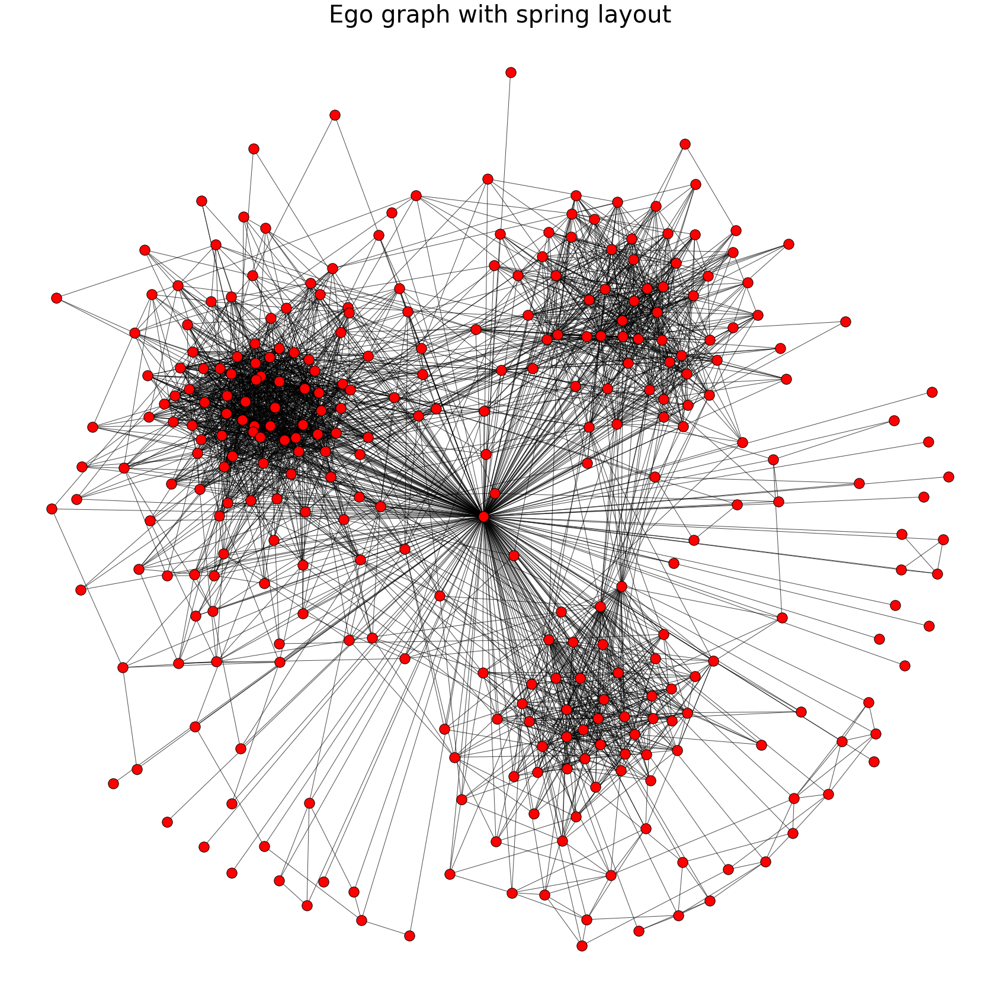

In [52]:
plt.figure(figsize=(30, 30))
spring_layout = nx.spring_layout(ego_G, seed=42)

nx.draw_networkx_nodes(ego_G, spring_layout, node_color='r', edgecolors='k')
nx.draw_networkx_edges(ego_G, spring_layout, alpha=0.7)

plt.title('Ego graph with spring layout', fontdict={'fontsize': 40})
plt.axis('off')
image_counter = (f"{i:02d}" for i in range(1, 100))
plt.savefig(f'images/{image_counter.__next__()}.png')
plt.show()

We can immediately see 3 major cluster forming even without doing any machine learning. That's good, but we also see a lot of lonely nodes, with just a single edge, connected to me. There's no way of knowing which cluster they belong to at this moment so to make the graph more clear we can simply hide them. And to make the clusters stand out more we can hide my edges too. Note that the nodes and edges we hide are still in the graph affecting the rest of the nodes, we simply don't visualize them.

As an extra piece of information, we can separate the nodes for which we have a friendlist and the ones for which we don't. That way we can see if the clustering works for nodes with missing information.

In [53]:
# have friendlist
info_nodes = list(ego_frame.source_id.unique())

# don't have friendlist but are connected to my friends
mystery_nodes = list(ego_frame[~ego_frame.target_id.isin(ego_frame.source_id)].target_id.unique())

# don't have friendlist and are not connected to my friends
no_info_nodes = [node for node in dict(ego_G.degree).keys() if ego_G.degree[node] < 2]

Font 'rm' does not have a glyph for '\U0001f914' [U+1f914], substituting with a dummy symbol.


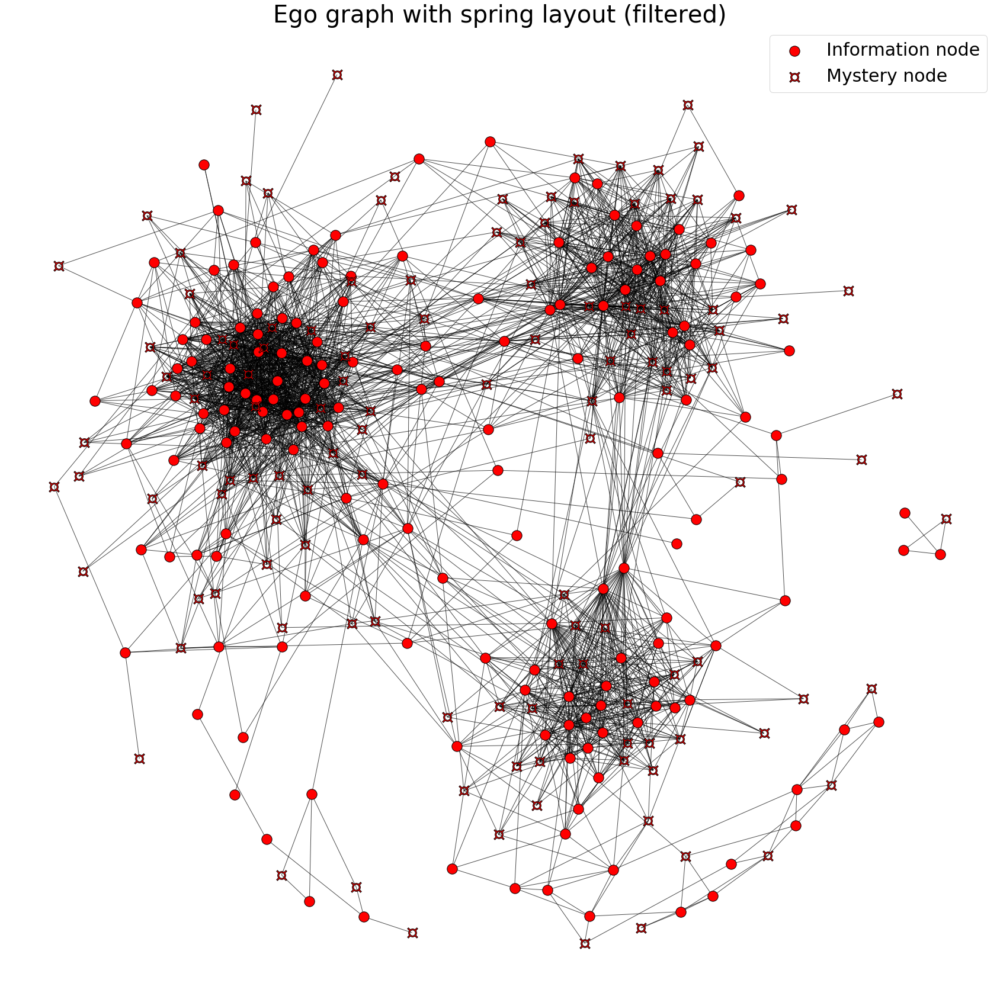

In [54]:
plt.figure(figsize=(30, 30))

my_id = edge_frame[edge_frame.source==ME].source_id.unique()[0]
nodelist = [n for n in info_nodes if (not n==my_id) and (n not in no_info_nodes)]
nx.draw_networkx_nodes(ego_G, spring_layout, nodelist=nodelist, node_color='r', edgecolors='k')
nodelist = [n for n in mystery_nodes if n not in no_info_nodes]                       # yes I know it's not gonna visualize
nx.draw_networkx_nodes(ego_G, spring_layout, nodelist=nodelist, node_color='r', edgecolors='k', node_shape='$🤔$')
edgelist = [e for e in ego_G.edges if my_id not in e]
nx.draw_networkx_edges(ego_G, spring_layout, edgelist=edgelist, alpha=0.7)

plt.title('Ego graph with spring layout (filtered)', fontdict={'fontsize': 40})
plt.legend(['Information node', 'Mystery node'], fontsize=30)
plt.axis('off')
plt.savefig(f'images/{image_counter.__next__()}.png')
plt.show()

That's better. We can see that even with missing information about half of the nodes, the other half compensates and forms some nice clusters. Now let's try and actually separate them by color.

### Optimal community detection methods

#### Clauset-Newman-Moore

Clauset-Newman-Moore greedy modularity maximization works like this: Initially, every node belongs to its own community, then, at each step, the algorithm repeatedly merges pairs of communities together and chooses the merger for which the resulting modularity is the largest. The algorithm stops when all the nodes in the network are in a single community after (count of nodes − 1) steps of merging. What we get at the end is the communities with the best modularity score.

In [55]:
clauset_newman_moore = nx.community.greedy_modularity_communities(ego_G)

A nice way of pairing node color with a different shade of the same color for the edges:

In [56]:
def get_paired_color_palette(size):
    palette = []
    for i in range(size*2):
        palette.append(plt.cm.Paired(i))
    return palette

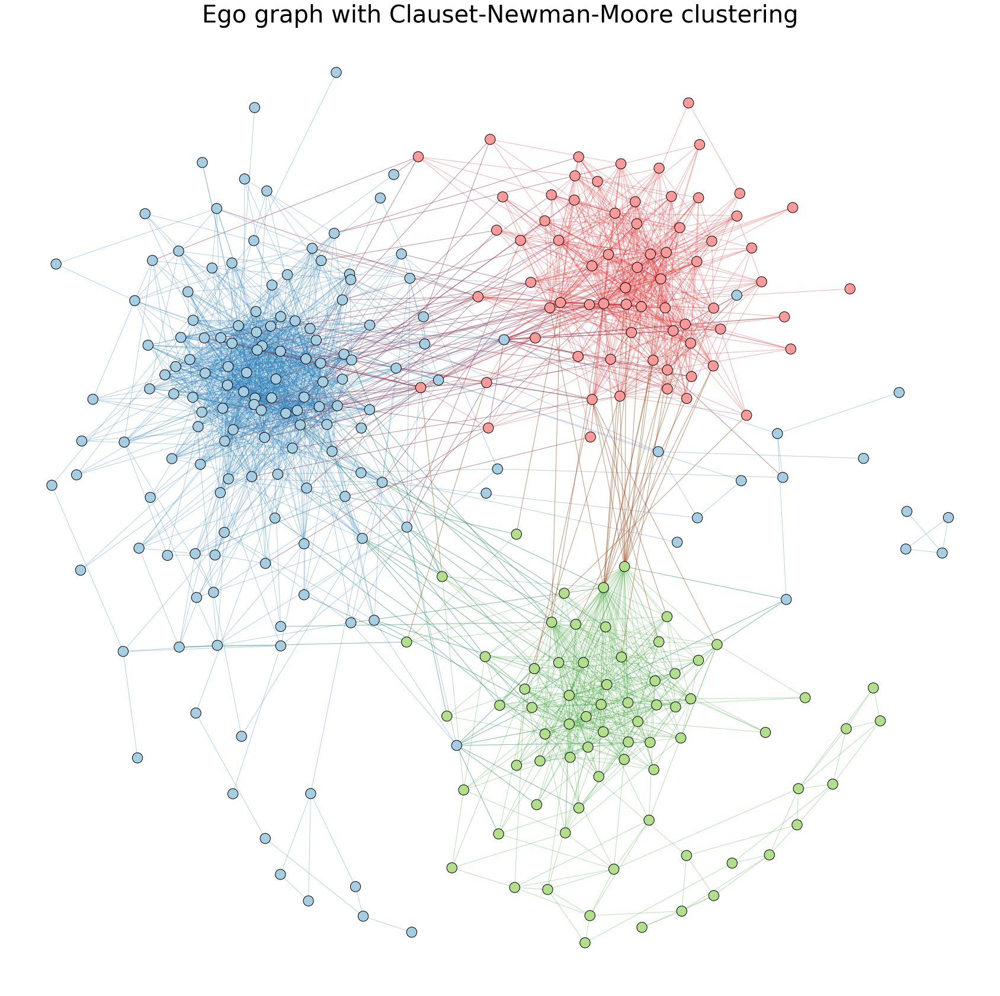

In [57]:
plt.figure(figsize=(30, 30))
clusters_count = len(clauset_newman_moore)
light_colors = get_paired_color_palette(clusters_count)[0::2]
dark_colors = get_paired_color_palette(clusters_count)[1::2]

for i in range(clusters_count):
    nodelist = [n for n in ego_G.nodes if (n not in no_info_nodes) & (n in list(clauset_newman_moore[i]))]
    edgelist = [e for e in ego_G.edges if (my_id not in e) and (e[0] in list(clauset_newman_moore[i]) or e[1] in list(clauset_newman_moore[i]))]
    node_color = [light_colors[i] for _ in range(len(nodelist))]
    edge_color = [dark_colors[i] for _ in range(len(edgelist))]
    nx.draw_networkx_nodes(ego_G, spring_layout, nodelist=nodelist, node_color=node_color, edgecolors='k')                                                                                                           
    nx.draw_networkx_edges(ego_G, spring_layout, edgelist=edgelist, alpha=1/clusters_count, edge_color=edge_color)

plt.title('Ego graph with Clauset-Newman-Moore clustering', fontdict={'fontsize': 40})
plt.axis('off')
plt.savefig(f'images/{image_counter.__next__()}.png')
plt.show()

Looks like this algorithm is a good start, but we can see a few smaller clusters that are not separated from the larger ones. 

#### Louvain

The [Louvain](https://arxiv.org/pdf/0803.0476.pdf) method of community detection also uses a greedy approach and initially assigns each node to an individual community. However, instead of a search over all edges, the Louvain method executes a local search over the edges of each node. Each node is combined with the neighbour that most increases its modularity. This process of reassigning communities is repeated over several iterations, until modularity is increased. Once this first-phase allocation of communities is determined, the Louvain method joins nodes within a community into supernodes. The inner iteration is then repeated over these supernodes. The steps of the inner and outer iterations are executed repeatedly until the number of communities is suitably small and the modularity cannot be increased any further.

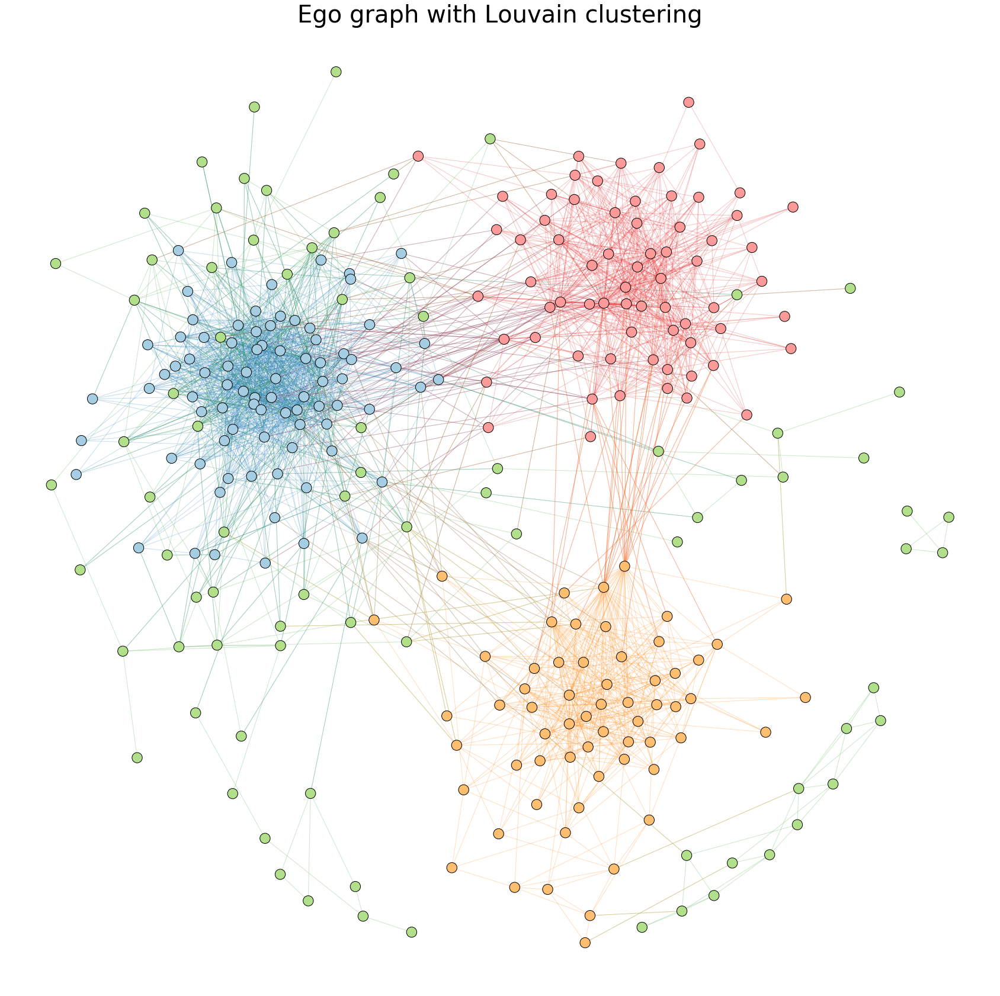

In [58]:
louvain = community.best_partition(ego_G, random_state=42)
plt.figure(figsize=(30, 30))
clusters_count = len(set(louvain.values()))
light_colors = get_paired_color_palette(clusters_count)[0::2]
dark_colors = get_paired_color_palette(clusters_count)[1::2]

for i in set(louvain.values()):
    nodelist = [n for n in ego_G.nodes if (louvain[n]==i) and (n not in no_info_nodes)]
    edgelist = [e for e in ego_G.edges if (my_id not in e) and ((louvain[e[0]]==i) or (louvain[e[1]]==i))]
    node_color = [light_colors[i] for _ in range(len(nodelist))]
    edge_color = [dark_colors[i] for _ in range(len(edgelist))]
    nx.draw_networkx_nodes(ego_G, spring_layout, nodelist=nodelist, node_color=node_color, edgecolors='k')                                                                                                           
    nx.draw_networkx_edges(ego_G, spring_layout, edgelist=edgelist, alpha=1/clusters_count, edge_color=edge_color)

plt.title('Ego graph with Louvain clustering', fontdict={'fontsize': 40})
plt.axis('off')
plt.savefig(f'images/{image_counter.__next__()}.png')
plt.show()

We can see one additional cluster, but it doesn't differentiate between the small communities inside it. This is a known drawback of modularity, as it suffers a resolution limit and is unable to detect smaller communities in graphs.

Networkx has a couple more community finding algorithms but we will come back to them later. First we will test one more methods from the `igraph` library.<br>
There doesn't seem to be a way to make it communicate with networkx so we will have to export the graph in a format that igraph can read.

In [59]:
labels = edge_frame[['target_id', 'target']].set_index('target_id').to_dict()['target']
for key, value in friend_ids.set_index('node_id').to_dict()['node'].items():
    labels[key] = value
ego_labels = {k:v for k, v in labels.items() if k in ego_G.nodes}

In [60]:
ego_G.add_nodes_from([(k, {'name': v}) for k, v in ego_labels.items()])
nx.write_gml(ego_G, 'ego_G.gml')

In [61]:
ego_g = ig.Graph.Read_GML('ego_G.gml')
print(nx.info(ego_G), '\n')
print(ego_g.summary())

Name: 
Type: Graph
Number of nodes: 311
Number of edges: 2792
Average degree:  17.9550 

IGRAPH UN-- 311 2792 -- 
+ attr: id (v), label (v), name (v)


In [62]:
# fixes mojibake bug
for i in range(len(ego_g.vs['name'])):
    ego_g.vs[i]['name'] = ego_labels[int(ego_g.vs[i]['label'])]

#### Infomap
Finds the community structure of the network according to the Infomap method of Martin Rosvall and Carl T. Bergstrom.
The core of the algorithm follows closely the Louvain method: neighboring nodes are joined into modules, which subsequently are joined into supermodules and so on. First, each node is assigned to its own module. Then, in random sequential order, each node is moved to the neighboring module that results in the largest decrease of the [**map equation**](https://arxiv.org/pdf/0906.1405.pdf). If no move results in a decrease of the map equation, the node stays in its original module. This procedure is repeated, each time in a new random sequential order, until no move generates a decrease of the map equation.

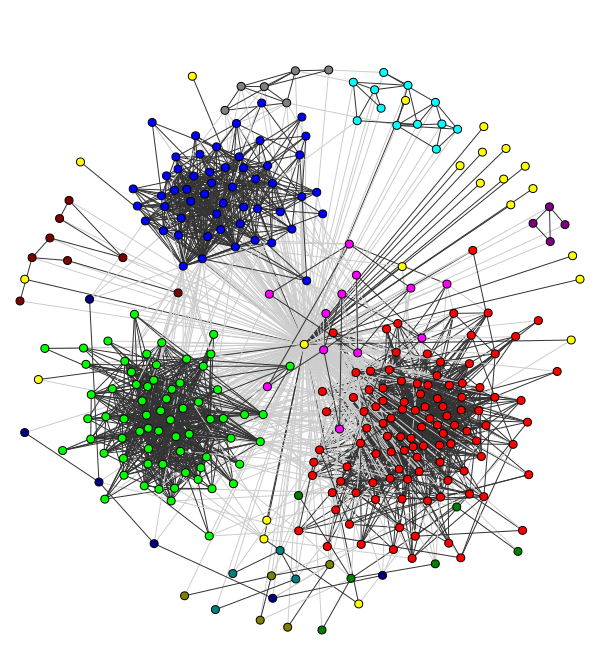

In [63]:
infomap = ego_g.community_infomap(trials=100)
plot = ig.Plot(f'images/{image_counter.__next__()}.png', background="white", bbox=(600, 650))
plot.add(infomap, layout=ego_g.layout(layout='fr'), mark_groups=False, vertex_size=8, vertex_label=None, bbox=(20, 70, 580, 630))
plot.redraw()
ctx = cairocffi.Context(plot.surface)
ctx.set_font_size(20)
drawer = TextDrawer(ctx, text="Ego graph with Infomap clustering", halign=TextDrawer.CENTER)
drawer.draw_at(0, 50, width=600)
plot.save()
plot

Great, this time we have a lot more clusters, but we can't compare the graphs just by looking at them! We can evaluate the algorithms by the following metrics:

**Modularity** is the most popular measure of the structure of networks. It is the fraction of the edges that fall within the given groups minus the expected fraction if edges were distributed at random. Networks with high modularity have dense connections between the nodes within clusters but sparse connections between nodes in different clusters.

**The coverage** of a clustering is given as the fraction of the weight of all intra-cluster edges with respect to the total weight of all edges in the whole graph. Higher values of coverage mean that there are more edges inside the clusters than edges linking different clusters, which translates to a better clustering.

**Performance** counts the number of internal edges in a cluster along with the edges that don’t exist between the cluster’s nodes and other nodes in the graph. Higher values indicate that a cluster is both internally dense and externally sparse and, therefore, a better cluster.

In [64]:
# need to transform all the graphs in the same format for the below function to work
clusters = []
for cluster in range(len(set(louvain.values()))):
    cluster_list = []
    for k, v in louvain.items():
        if v == cluster:            
            cluster_list.append(k)
    clusters.append(cluster_list)
louvain = clusters

ego_g.vs['membership'] = infomap.membership
clusters = []
for i in range(len(infomap.sizes())):
    cluster = []
    for vertex in ego_g.vs:        
        if vertex['membership'] == i:
            cluster.append(int(vertex['label']))
    clusters.append(cluster)
infomap, clusters = clusters, None

In [65]:
algorithms = ['clauset_newman_moore', 'louvain', 'infomap']
fig = go.Figure(data=[
    go.Bar(name='Modularity', x=algorithms, y=[nx.community.modularity(ego_G, eval(algorithm)) for algorithm in algorithms]),
    go.Bar(name='Coverage', x=algorithms, y=[nx.community.coverage(ego_G, eval(algorithm)) for algorithm in algorithms]),
    go.Bar(name='Performance', x=algorithms, y=[nx.community.performance(ego_G, eval(algorithm)) for algorithm in algorithms])])

fig.update_layout(barmode='group',
                  title=go.layout.Title(text='Comparison of metrics between clustering algorithms', xref="paper"))
fig.write_image(f"images/{image_counter.__next__()}.png")
fig.show()

It looks like each algorithm has its advantages and disadvantages. CNM has the highest coverage, but Louvain has higher modularity and performance score. Even though they both aim to maximize the modularity score, Louvain appears to do better, which makes sense as the algorithm was developed by improving the already existing CNM. Infomap on the other hand doesn't rely on modularity and instead uses the map equation as a scoring function which gives it the highest performance score of them all.

All these graphs are great, but how are we to evaluate the communities if we can't even see people's names? Let's make an interactive graph, that let's us decide for ourselves if the clustering is correct.<br>
First, we can clean up each person's description into something more readable.

In [66]:
description_frame = edge_frame.copy()
description_frame.description = description_frame.description.str.replace(r'.*at ', ' ')
description_frame.description = description_frame.description.str.strip()
description_frame.description.value_counts().head()

mutual friends     20521
Varna, Bulgaria     2499
friends             2216
Sofia, Bulgaria     2180
Facebook             855
Name: description, dtype: int64

Then we can remove all the descriptions that don't give us any information.

In [67]:
stop_word = ['mutual friends', 'friends', 'Facebook', 'Self-Employed']
description_frame = description_frame[~description_frame.description.isin(stop_word)]
description_frame.description.value_counts().head()

Varna, Bulgaria                             2499
Sofia, Bulgaria                             2180
Sofia University                             709
University of Economics Varna                430
University of National and World Economy     400
Name: description, dtype: int64

And since almost all of the people in my Ego graph have no description, we can assign the three most common descriptions from each person's friendlist as his own.

In [68]:
for node in ego_G.nodes:
    ego_G.node[node]['top'] = list(description_frame.description[(description_frame.target_id!=my_id) &\
                                                  (description_frame.source_id==node)].value_counts()[:3].keys())

While we're at it, why not add a few more layouts.

In [69]:
# One-line pickling, don't think about it
def jar(file, pickled=False):
    if pickled:
        try:
            with open(f"shelf/{file}.pickle", "rb") as f:
                return pickle.load(f)
        except:
            print("File could not be opened!")
    else:
        try:
            with open(f"shelf/{file}.pickle", "wb") as f:
                pickle.dump(eval(file), f, protocol=pickle.HIGHEST_PROTOCOL)        
                print("File saved successfully.")
        except:
            print("File coud not be saved!")

In [70]:
kamada_kawai_layout = nx.kamada_kawai_layout(ego_G)

# force_atlas_2 = forceatlas2.forceatlas2_networkx_layout(ego_G, niter=1000)
force_atlas_2 = jar('force_atlas_2', pickled=True)

We're going to reuse this function further in the notebook, so we'll add some additional functionality that won't be usable at this moment.

In [71]:
# fix node attributes
def interactive_clustering(hide=True,
                           attributes=False,
                           search=None,
                           layout='spring_layout',
                           clustering='clauset_newman_moore',
                           k=32,
                           node_attr='top'):
    
    # hides single-edge nodes
    if hide:
        nodelist = [n for n in ego_G.nodes if (n not in no_info_nodes) and (not n==my_id)]
        edgelist = [e for e in ego_G.edges if (my_id not in e) and ((e[0] not in no_info_nodes) and (e[1] not in no_info_nodes))]
    else:
        nodelist = [n for n in ego_G.nodes]
        edgelist = [e for e in ego_G.edges]
    
    # edges
    edge_x = []
    edge_y = []
    pos=eval(layout)
    for edge in edgelist:
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)
    edge_trace = go.Scatter(x=edge_x,
                            y=edge_y,
                            line=dict(width=0.5, color='#888'),
                            hoverinfo='none',
                            mode='lines')   
    # nodes
    node_x = []
    node_y = []
    for node in nodelist:
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)    
    node_trace = go.Scatter(x=node_x,
                            y=node_y,
                            mode='markers',
                            hoverinfo='text',
                            marker=dict(showscale=False,
                                        colorscale='hsv',
                                        size=10,
                                        line_width=2))
    
    # clustering, attributes preparation
    cluster_dict = {}
    cluster_attr = {}
    counter = Counter()
    c = eval(clustering)
    # if it's hierarchical clustering
    if len(c) > 307:
        for cluster in range(len(c[k-1])):
            for node in c[k-1][cluster]:
                cluster_dict[node] = cluster+1
                if attributes:
                    if ego_G.node[node][node_attr]:
                        counter[ego_G.node[node][node_attr][0]] += 1
            cluster_attr[cluster+1] = [i[0] for i in counter.most_common(3)]
            counter.clear()
    # if it's optimal clustering
    else:
        for cluster in range(len(c)):
            for node in c[cluster]:
                cluster_dict[node] = cluster+1
                if attributes:
                    if ego_G.node[node][node_attr]:
                        counter[ego_G.node[node][node_attr][0]] += 1
            cluster_attr[cluster+1] = [i[0] for i in counter.most_common(3)]
            counter.clear()
    
    # colors, names, attributes
    node_text = []
    node_colors = []
    for node_id in nodelist:
        node_colors.append(cluster_dict[node_id])
        if attributes:
            node_text.append(f"{labels[node_id]} - №{cluster_dict[node_id]}\
            <br>Node attributes:<br>{ego_G.node[node_id][node_attr]}\
            <br>Cluster attributes:<br>{cluster_attr[cluster_dict[node_id]]}")
        else:
            node_text.append(f"{labels[node_id]} - №{cluster_dict[node_id]}")
    node_trace.marker.color = node_colors
    node_trace.text = node_text
    
    # actual fig drawing
    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(width=600,
                                     height=600,
                                     title=f'Ego graph with {clustering} clustering',
                                     titlefont_size=16,
                                     showlegend=False,
                                     hovermode='closest',
                                     margin=dict(b=20,l=5,r=5,t=40),
                                     annotations=[dict(text="P. Bogdanov - Software University",
                                                       showarrow=False,
                                                       xref="paper",
                                                       yref="paper",
                                                       x=0.005,
                                                       y=-0.002 )],
                                     xaxis=dict(showgrid=False,
                                                zeroline=False,
                                                showticklabels=False),
                                     yaxis=dict(showgrid=False,
                                                zeroline=False,
                                                showticklabels=False),
                                     plot_bgcolor='white'))

    # search functionality
    if search:
        for node in node_trace['text']:
            if search in node:
                index = node_trace['text'].index(node)                
                fig.add_scatter(x=[node_trace.x[index]],
                                y=[node_trace.y[index]],
                                mode="text",
                                text=search)

    fig.show()

In [72]:
interact(interactive_clustering,
         hide=widgets.Checkbox(value=True,
                               description='Hide single edge nodes'),
         attributes=widgets.Checkbox(value=False,
                                     description='Show attributes'),
         search=widgets.Combobox(options=tuple([labels[i] for i in labels.keys() if i in ego_G.nodes] + ['']),
                                 placeholder='Your name here',
                                 description='Search: ',
                                continuous_update=False),
         layout=widgets.RadioButtons(options=['spring_layout',
                                              'force_atlas_2',
                                              'kamada_kawai_layout'],
                                     value='force_atlas_2',
                                     description='Layout: '),
         clustering=widgets.RadioButtons(options=['clauset_newman_moore', 'louvain', 'infomap'],
                                         value='infomap',
                                         description='Algorithm: '),         
         k=widgets.IntSlider(layout=Layout(display='None'), disabled = True),
         node_attr=widgets.Text(value='top',layout=Layout(display='None'), disabled = True))

interactive(children=(Checkbox(value=True, description='Hide single edge nodes'), Checkbox(value=False, descri…

<function __main__.interactive_clustering>

Looking at the graph while knowing who each node is is much better. The three major clusters common in the three algorithms are people from my highschool, people from my university and the people which I go out with. It's interesting to see that the people from my last job are connected to the university cluster, but infomap algorithm separates them into a different community. Even more interesting is that of those people it has separated those who have graduated from the university from the rest of my job colleagues. The rest of the mini-clusters are separated by city, some more correctly than others.

It is clear that there are many levels of potential communities to be found. If we want to see those levels we will need a hierarchical algorithm.

### Hierarchical community detection methods
#### Girvan-Newman
The Girvan-Newman algorithm detects communities by progressively removing edges from the original network. The connected components of the remaining network are the communities. Instead of trying to construct a measure that tells us which edges are the most central to communities, the Girvan-Newman algorithm focuses on edges that are most likely "between" communities.

In [73]:
# girvan_newman = []
# for i in nx.community.girvan_newman(ego_G):
#     girvan_newman.append(i)
girvan_newman = jar('girvan_newman', pickled=True)

#### Walktrap

The [walktrap](https://www-complexnetworks.lip6.fr/~latapy/Publis/communities.pdf) algorithm of Latapy & Pons tries to find communities in a graph via random walks. The idea is that short random walks on a graph tend to get "trapped" into densely connected parts corresponding to communities. Using some properties of random walks on graphs it defines a measurement of the structural similarity between nodes and between communities, thus defining a distance which can be used in a hierarchical clustering algorithm

In [74]:
# walktr = ego_g.community_walktrap()
# walktrap = []
# for clust_count in range(1, len(ego_G.nodes)+1):
#     clust = walktr.as_clustering(n=clust_count)
#     ego_g.vs['membership'] = clust.membership
#     clusters = []
#     for i in range(clust_count):
#         cluster = []
#         for vertex in ego_g.vs:        
#             if vertex['membership'] == i:
#                 cluster.append(int(vertex['label']))
#         clusters.append(cluster)
#     walktrap.append(clusters)
walktrap = jar('walktrap', pickled=True)

#### Fluid Communities
The [Fluid Communities](https://arxiv.org/pdf/1703.09307.pdf) algorithm is based on the simple idea of fluids interacting in an environment, expanding and pushing each other. First each of the initial k communities is initialized in a random vertex in the graph. Then the algorithm iterates over all vertices in a random order, updating the community of each vertex based on its own community and the communities of its neighbours. This process is performed several times until convergence. At all times, each community has a total density of 1, which is equally distributed among the vertices it contains. If a vertex changes of community, vertex densities of affected communities are adjusted immediately. When a complete iteration over all vertices is done, such that no vertex changes the community it belongs to, the algorithm has converged and returns.

In [75]:
# asyn_fluidc = []
# for i in range(1, len(ego_G)):
#     instance = nx.community.asyn_fluidc(ego_G, i, max_iter=300, seed=42)
#     asyn_fluidc.append([com for com in instance])
asyn_fluidc = jar('asyn_fluidc', pickled=True)

Now we can explore communities at various resolutions by specifying the number of clusters we want.

In [76]:
interact(interactive_clustering,
         hide=widgets.Checkbox(value=True,
                               description='Hide single edge nodes'),
         attributes=widgets.Checkbox(value=False,
                                     description='Show attributes'),
         search=widgets.Combobox(options=tuple([ego_labels[i] for i in ego_labels.keys()] + ['']),
                                 placeholder='Your name here',
                                 description='Search: '),
         layout=widgets.RadioButtons(options=['spring_layout',
                                              'force_atlas_2',
                                              'kamada_kawai_layout'],
                                     value='force_atlas_2',
                                     description='Layout: '),
         clustering=widgets.RadioButtons(options=['girvan_newman', 'asyn_fluidc', 'walktrap'],
                                         value='girvan_newman',
                                         description='Algorithm: '),         
         k=widgets.IntSlider(min=1,
                             max=len(ego_G.nodes)-1,
                             step=1,
                             value=32,
                             layout=Layout(width='90%'),
                             description='Clusters: ',
                             continuous_update=False),
        node_attr=widgets.Text(value='top',layout=Layout(display='None'), disabled = True))

interactive(children=(Checkbox(value=True, description='Hide single edge nodes'), Checkbox(value=False, descri…

<function __main__.interactive_clustering>

We can change the number of clusters for each algorithm and eyeball it _or_ we can look at the metrics for more insight.

In [77]:
optimal = ['clauset_newman_moore', 'louvain', 'infomap']
hierarchical = ['girvan_newman', 'asyn_fluidc', 'walktrap']
metrics_list = ['modularity', 'coverage', 'performance']

In [78]:
# optimal_results = []
# for algorithm in optimal:
#     optimal_dict = {}
#     optimal_dict['modularity'] = [nx.community.modularity(ego_G, eval(algorithm))]
#     optimal_dict['coverage'] = [nx.community.coverage(ego_G, eval(algorithm))]
#     optimal_dict['performance'] = [nx.community.performance(ego_G, eval(algorithm))]
#     optimal_results.append(optimal_dict)
optimal_results = jar('optimal_results', pickled=True)

In [79]:
# hierarchical_results = []
# for algorithm in hierarchical:
#     hierarchical_dict = {}
#     hierarchical_dict['modularity'] = [nx.community.modularity(ego_G, eval(algorithm)[i]) for i in range(len(eval(algorithm)))]
#     hierarchical_dict['coverage'] = [nx.community.coverage(ego_G, eval(algorithm)[i]) for i in range(len(eval(algorithm)))]
#     hierarchical_dict['performance'] = [nx.community.performance(ego_G, eval(algorithm)[i]) for i in range(len(eval(algorithm)))]
#     hierarchical_results.append(hierarchical_dict)
hierarchical_results = jar('hierarchical_results', pickled=True)

In [80]:
def metrics(G, metrics_list, hierarchical_algorithms, hierarchical_results, optimal_algorithms, optimal_results):
    for metric in metrics_list:
        fig = go.Figure()
        for algorithm in hierarchical_algorithms:

            fig.add_trace(go.Scatter(x=[i+1 for i in range(len(eval(algorithm)))],
                                     y=hierarchical_results[hierarchical_algorithms.index(algorithm)][metric],
                                     mode='lines',
                                     name=algorithm))
        for algorithm in optimal_algorithms:
            fig.add_trace(go.Scatter(x=[(len(eval(algorithm)))],
                                     y=optimal_results[optimal_algorithms.index(algorithm)][metric],
                                     mode='markers',
                                     name=algorithm))
        fig.update_layout(title=go.layout.Title(text=metric[:1].upper()+metric[1:]+" in clustering algorithms", xref="paper"),
                          xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Number of clusters")),
                          yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text=metric[:1].upper()+metric[1:])))
        fig.write_image(f"images/{image_counter.__next__()}.png")
        fig.show()

In [81]:
metrics(ego_G, metrics_list, hierarchical, hierarchical_results, optimal, optimal_results)

We can see that the three algorithms are vastly different from each other but they do have some crossing points. Almost all of them peak early on at about 6 clusters, except Girvan-Newman, which is barely changing at that level. This can be explained by the fact that the other methods separate the biggest clusters in the beginning, while Girvan-Newman trims the one-edge nodes first and works its way up to the bigger clusters from there. An interesting point is the secondary peak at cluster count 32, most notable in Girvan-Newman but present in Walktrap as well. This is a clustering we can't get with the optimal community findig algorithms, because they all converge early on around the first peak. Now we have a choice - if we want a broader view of the communities we can choose a cluster count of 6, but if we want more details then our cluster count is 32.

### Semi-supervised community detection

So far we've tried unsupervised aproaches that rely solely on the connections between the nodes. But that's not all we've got. Some of our nodes have descriptions that can be used in a semi-supervised approach.

#### Label propagation
[Label Propagation](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.14.3864&rep=rep1&type=pdf) is a semi-supervised machine learning algorithm that assigns labels to previously unlabeled data points. At initial condition, the nodes carry a label that denotes the community they belong to. Membership in a community changes based on the labels that the neighboring nodes possess. This change is subject to the maximum number of labels within one degree of the nodes. Every node is initialized with a unique label, then the labels diffuse through the network. Consequently, densely connected groups reach a common label quickly. When many such dense groups are created throughout the network, they continue to expand outwards until it is impossible to do so.

Currently our "labels" are nothing more than strings. Some of them refer to the same location, but are written in a different way. If we want to use them in a meaningfull way, we need to transform them.<br> Geopy will do the trick. It offers a free geocoding functionallity that can give us not only the geographic coordinates of the location, but also its type. The only limitation is that if we want to use it in bulk we need to put a rate limiter on the queries.

In [82]:
locator = Nominatim(user_agent="FacebookLocator")
geocode = RateLimiter(locator.geocode, min_delay_seconds=1, return_value_on_exception='Error')

This is going to take a while so we better minimize the amount of queries we'll need.

In [83]:
locations = pd.DataFrame(description_frame.description.value_counts().keys(), columns=['address'])
not_real_locations = ['BMW', 'The Krusty Krab', 'МВР', 'YouTube', 'Tumblr', 'Freelancer', 'McDonald\'s', 'Oriflame', 'None', '']
locations = locations[~locations.address.isin(not_real_locations)]
print("Count of unique descriptions:", len(locations))

Count of unique descriptions: 21728


In [84]:
# # takes about a day
# locations['location'] = locations['address'].apply(geocode)
# locations = pd.concat([locations, manually_added], sort=False)
# locations = locations.reset_index(drop=True)
# unknown_locations = locations[locations.location.isnull()]
# locations = locations[locations.location.notnull()]      
locations = jar('locations', pickled=True)
unknown_locations = jar('unknown_locations', pickled=True)
print("Count of locations that could not be geocoded:", len(unknown_locations))
print("Count of geocoded locations:", len(locations))

Count of locations that could not be geocoded: 11901
Count of geocoded locations: 9826


Extract all available information we have for each location:

In [85]:
locations['point'] = locations['location'].apply(lambda loc: tuple(loc.point) if loc else None)
locations['raw'] = locations['location'].apply(lambda loc: loc.raw if loc else None)

Merge locations with nodes:

In [86]:
additional = locations.raw.apply(pd.Series)
locations = locations.join(additional, rsuffix='index').drop(columns=['addressindex'])
locations = pd.merge(edge_frame, locations, left_on='description', right_on='address', how='left')

Let's see all the locations we have available.

In [87]:
map_df = locations.dropna().copy()
map_df['nodes_count'] = map_df.groupby('osm_id').osm_id.transform('count')
map_df.osm_id = map_df.osm_id.drop_duplicates()
map_df = map_df.dropna()

scaler = MinMaxScaler(feature_range=(0.02, 1))
scaler.fit(map_df[['nodes_count']])
map_df['nodes_count_scaled'] = scaler.transform(map_df[['nodes_count']])

fig = px.scatter_geo(map_df,
                     lat="lat",
                     lon="lon",
                     hover_name="address",
                     text='nodes_count',
                     opacity=0.5,
                     color='nodes_count_scaled',
                     size='nodes_count_scaled',
                     title='Available locations')
fig.update_layout(margin={"r":0,"t":80,"l":0,"b":0})
fig.write_image(f"images/{image_counter.__next__()}.png")
fig.show()

Great, we have locations all over the world. Not only that, but we have the type of the location as well. That gives us some additional options to choose from.

In [88]:
def propagate_by(by='full'):    
    # different options for propagation
    education_list = ['school', 'university', 'college', 'educational_institution', 'music_school', 'language_school']
    if by=='education':        
        location = locations[locations.type.isin(education_list)]
    elif by=='area':
        location = locations[(locations.type.isin(['city', 'town', 'village'])) | (locations['class']=='boundary')]
    else:
        location = locations[locations.osm_id.notna()]
    
    # the algorithm implementation needs the ids to start from 0
    location = location.assign(location_id=(locations['osm_id']).astype('category').cat.codes)
    by_dict = location[['target_id', 'location_id']].set_index('target_id').to_dict()['location_id']
    G = nx.from_pandas_edgelist(edge_frame, source='source_id', target='target_id')
    
    # we're using igraph so we need to transform our graph to the proper fromat
    G.add_nodes_from([(k, {'name': v}) for k, v in labels.items()])
    G.add_nodes_from([(k, {by: v}) for k, v in by_dict.items()])
    nx.write_gml(G, 'G.gml')
    g = ig.Graph.Read_GML('G.gml')
    
    # fix mojibake and prepare attributes
    for i in range(len(g.vs['name'])):
        g.vs[i]['name'] = labels[int(g.vs[i]['label'])]
    for i in range(len(g.vs[by])):
        try:
            g.vs[i][by] = by_dict[int(g.vs[i]['label'])]
            g.vs[i]['fixed'] = True
        except:        
            g.vs[i][by] = -1
            g.vs[i]['fixed'] = False
    
    # the actual model
    label_propagation = g.community_label_propagation(initial=g.vs[by], fixed=g.vs['fixed'])
    
    # make it human readable
    id_to_address = location[['location_id', 'address']].set_index('location_id').to_dict()['address']
    
    # transform format to nx-like clusters, leave only ego_G nodes and change node_attr
    label_prop = []
    attributes = {}
    for i in range(len(label_propagation)):
        cluster = []
        cluster_locations = set(label_propagation.subgraph(i).vs[by])
        for node in label_propagation.subgraph(i).vs:        
            if int(node['label']) in ego_labels.keys():
                cluster.append(int(node['label']))
                if len(cluster_locations) > 1:
                    ego_G.node[int(node['label'])][by] = [id_to_address[sorted(list(cluster_locations))[1]]]
                else:
                    ego_G.node[int(node['label'])][by] = [id_to_address[sorted(list(cluster_locations))[0]]]
        if cluster:
            label_prop.append(cluster)
    return label_prop

Let's try it with these 3 options:

In [89]:
# label_prop_by_area = propagate_by('area')
# label_prop_by_education = propagate_by('education')
# label_prop_full = propagate_by('full')
label_prop_by_area = jar('label_prop_by_area', pickled=True)
label_prop_by_education = jar('label_prop_by_education', pickled=True)
label_prop_full = jar('label_prop_full', pickled=True)
ego_G = jar('ego_G', pickled=True)

In [90]:
interact(interactive_clustering,
         hide=widgets.Checkbox(value=False,
                               description='Hide single edge nodes'),
         attributes=widgets.Checkbox(value=True,
                                     description='Show attributes'),
         search=widgets.Combobox(options=tuple([labels[i] for i in labels.keys() if i in ego_G.nodes] + ['']),
                                 placeholder='Your name here',
                                 description='Search: ',
                                 continuous_update=False),
         layout=widgets.RadioButtons(options=['spring_layout',
                                              'force_atlas_2',
                                              'kamada_kawai_layout'],
                                     value='spring_layout',
                                     description='Layout: '),
         clustering=widgets.RadioButtons(options=["label_prop_by_area", "label_prop_by_education", "label_prop_full"],
                                        value="label_prop_by_education",
                                         description='Algorithm: '),         
         k=widgets.IntSlider(layout=Layout(display='None'), disabled = True),
         node_attr=widgets.RadioButtons(options=["top", "area", "education", "full"],
                                        value='education', description='Attributes: '))

interactive(children=(Checkbox(value=False, description='Hide single edge nodes'), Checkbox(value=True, descri…

<function __main__.interactive_clustering>

The advantages of this algorithm are obvious. We can extract useful information about single nodes that didn't belong to any cluster in the previous algoriths. It's pretty accurate for the sparsely connected unlabeled nodes, but the opposite is true for the ones that have a lot of connections between them. They tend to acquire each other's labels and end up being missclassified. In addition, due to the randomness of the algorithm it produces highly variable results. Nevertheless it is still usefull and can show us connections that the other algorithms can not.

We can compare the metrics but they migh be different on each run.

In [91]:
algorithms = ["label_prop_by_area", "label_prop_by_education", "label_prop_full"]
fig = go.Figure(data=[
    go.Bar(name='Modularity', x=algorithms, y=[nx.community.modularity(ego_G, eval(algorithm)) for algorithm in algorithms]),
    go.Bar(name='Coverage', x=algorithms, y=[nx.community.coverage(ego_G, eval(algorithm)) for algorithm in algorithms]),
    go.Bar(name='Performance', x=algorithms, y=[nx.community.performance(ego_G, eval(algorithm)) for algorithm in algorithms])])

fig.update_layout(barmode='group',
                  title=go.layout.Title(text='Comparison of metrics between label propagation algorithm', xref="paper"))
fig.write_image(f"images/{image_counter.__next__()}.png")
fig.show()

One last thing we can do is visualise the locations on the map.

In [92]:
map_df = pd.DataFrame()
attributes = ['area', 'education', 'full']
for attr in attributes:
    loc_dict = {}
    for i in ego_G.nodes:
        loc_dict[i] = ego_G.node[i][attr]
    for i in loc_dict.keys():
        point = locations[locations.address==loc_dict[i][0]].point.unique()[0][:2]
        loc_dict[i] = (loc_dict[i][0], point[0], point[1], attr)
        
    df = pd.DataFrame.from_dict(loc_dict).T.rename(columns={0: 'name', 1:'lat', 2:'lon', 3:'type'})
    df['friends_count'] = df.groupby('name').name.transform('count')
    scaler = MinMaxScaler(feature_range=(0.2, 1))
    scaler.fit(df[['friends_count']])
    df['friends_count_scaled'] = scaler.transform(df[['friends_count']])
    map_df = pd.concat([map_df, df])

fig = px.scatter_geo(map_df,
                     lat="lat",
                     lon="lon",
                     hover_name="name",
                     text='friends_count',
                     size='friends_count_scaled',
                     animation_frame='type',
                     color='type',
                     title='Friends locations')
fig.update_layout(margin={"r":0,"t":80,"l":0,"b":0})
fig.write_image(f"images/{image_counter.__next__()}.png")
fig.show()

### Graph Embedding

One of the limitations of graphs remains the absence of vector features. Besides reducing the engineering effort, these vector representations can lead to greater predictive power and allow us to use a broader range of machine learning tools. 


#### Node2Vec

One well-known algorithm that extracts information about entities using context alone is word2vec. The input to word2vec is a set of sentences, and the output is an embedding for each word. Similarly to the way text describes the context of each word via the words surrounding it, graphs describe the context of each node via neighbor nodes. The embeddings are learned in the same way as word2vec’s skip-gram embeddings are learned, using a skip-gram model. To generate the corpus, we use random walks sampling strategy

In [93]:
# ego_node2vec = Node2Vec(ego_G, temp_folder='node2vec')
# ego_model = ego_node2vec.fit()
ego_model = jar('ego_model', pickled=True)

Now instead of a graph specific algorithm, we can use any of the well known ML clustering approaches like K-means.

In [94]:
# kmeans = []
# silhouettes = {}
# inertia = {}
# for i in range(1, len(ego_G.nodes())-1):
#     X = ego_model.wv[ego_model.wv.vocab]
#     kmeans_model = KMeans(n_clusters=i, n_init=20, n_jobs=2, random_state=42)
#     kmeans_model.fit(X)
#     kmeans_labels = kmeans_model.labels_
#     # make compatible with interactive function
#     vector_clustering = []
#     for j in range(i+1):
#         cluster_list = []
#         for cluster, node in zip(kmeans_labels, ego_model.wv.vocab):
#             if (cluster==j) and (int(node) in ego_G.nodes()):
#                 cluster_list.append(int(node))
#         if cluster_list:
#             vector_clustering.append(cluster_list)
#     kmeans.append(vector_clustering)
#     # scoring to plot
#     inertia[i] = kmeans_model.inertia_
    
#     if i>1:
#         silhouettes[i] = silhouette_score(X, kmeans_labels, metric='euclidean')

kmeans = jar('kmeans', pickled=True)
silhouettes = jar('silhouettes', pickled=True)
inertia = jar('inertia', pickled=True)

To get a 2D representation of this high-dimensional space we can use TSNE. Note that the clustering we made earlier was in higher dimensions and this is simply a visualization of that space.

In [95]:
embeddings = np.array([ego_model.wv[x] for x in ego_model.wv.vocab])
tsne = TSNE(n_components=2, random_state=42, perplexity=15)
embeddings_2d = tsne.fit_transform(embeddings)

# make compatible with our interactive function
embeddings_layout = spring_layout.copy()
counter = 0
for x in ego_model.wv.vocab:
    for k, v in embeddings_layout.items():
        if str(k) == x:
            embeddings_layout[k] = embeddings_2d[counter]
            counter +=1

In [96]:
interact(interactive_clustering,
         hide=widgets.Checkbox(value=True,
                               description='Hide single edge nodes'),
         attributes=widgets.Checkbox(value=False,
                                     description='Show attributes'),
         search=widgets.Combobox(options=tuple([ego_labels[i] for i in ego_labels.keys()] + ['']),
                                 placeholder='Your name here',
                                 description='Search: '),
         layout=widgets.RadioButtons(options=['spring_layout',
                                              'force_atlas_2',
                                              'kamada_kawai_layout',
                                              'embeddings_layout'],
                                     value='embeddings_layout',
                                     description='Layout: '),
         clustering=widgets.RadioButtons(options=['girvan_newman', 'asyn_fluidc', 'walktrap', 'kmeans'],
                                         value='kmeans',
                                         description='Algorithm: '),         
         k=widgets.IntSlider(min=1,
                             max=308,
                             step=1,
                             value=32,
                             layout=Layout(width='90%'),
                             description='Clusters: ',
                             continuous_update=False),
        node_attr=widgets.Text(value='top',layout=Layout(display='None'), disabled = True))

interactive(children=(Checkbox(value=True, description='Hide single edge nodes'), Checkbox(value=False, descri…

<function __main__.interactive_clustering>

As we can see, structurally, the three main clusters are still present, but this time they are not so homogeneous. During the clustering process the sparsely connected nodes aren't getting divided first, as is the case with other hierarchical algorithms. Instead, K-means' random initialization results in a simultaneous grouping over the span of the whole graph.
In a way, this type of clustering is a combination of walktrap's random walks and fluid communities' random initialization.

This time we can check other types of metrics. Inertia is the sum of squared distances of samples to their closest cluster center. The elbow method is finding the "elbow" point after which the inertia start decreasing in a linear fashion. That will give us the optimal amount of clusters.

In [97]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(inertia.keys()), y=list(inertia.values()), mode='lines'))
fig.update_layout(title=go.layout.Title(text="Elbow method", xref="paper"),
                  xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Number of clusters")),
                  yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text="Inertia")))
fig.write_image(f"images/{image_counter.__next__()}.png")
fig.show()

Unfortunately we have no clear cut point that shows us the optimal amount of clusters, as any number between 5 and 50 can be that point.

Another metric is the silhouette index. Silhouette values near +1 indicate that the sample is far away from the neighboring clusters. A value of 0 indicates that the sample is on or very close to the decision boundary between two neighboring clusters and negative values indicate that those samples might have been assigned to the wrong cluster.

In [98]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(silhouettes.keys()), y=list(silhouettes.values()), mode='lines'))
fig.update_layout(title=go.layout.Title(text="Silhouette coefficients", xref="paper"),
                  xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Number of clusters")),
                  yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text="Silhouette coefficient")))
fig.write_image(f"images/{image_counter.__next__()}.png")
fig.show()

The silhouette index gives us another confirmation that a smaller number of clusters is probably more optimal. However, even the highest values of the index are pretty low, which means that the whole structure is weak and we might have made artificial clusters.

Finally, we can compare it to the rest of the algorithms:

In [99]:
hierarchical.append('kmeans')
# hierarchical_dict = {}
# hierarchical_dict['modularity'] = [nx.community.modularity(ego_G, kmeans[i]) for i in range(len(kmeans))]
# hierarchical_dict['coverage'] = [nx.community.coverage(ego_G, kmeans[i]) for i in range(len(kmeans))]
# hierarchical_dict['performance'] = [nx.community.performance(ego_G, kmeans[i]) for i in range(len(kmeans))]
hierarchical_dict = jar('hierarchical_dict', pickled=True)
hierarchical_results.append(hierarchical_dict)

metrics(ego_G, metrics_list, hierarchical, hierarchical_results, optimal, optimal_results)

As we can see, the method is very similar to Fluid Communities and is even sub-optimal in higher cluster count.

Even though the metrics are not kind to this clustering, it did provide us with a different type of grouping. While Girvan-Newman and Walktrap keep most of the nodes inside the bigger clusters unified and slowly trim them down untill there's no more left and Fluid Communities "spills out" at higher cluster count, returning more randomly distributed clusters, Node2Vec embedding combined with k-means clustering provides uniformly distributed communities and finds connections between nodes where other methods can't. This can be useful if we want to separate the groups by equal amount of nodes.

But the biggest advantage of graph embedding might be the availability to see the distances between nodes.

In [100]:
def most_similar(name):
    try:
        for node, percent in ego_model.wv.most_similar(str({v:k for k, v in ego_labels.items()}[name])):
                print(ego_labels[float(node)], percent)
    except:
        print("")

In [102]:
interact(most_similar, name=widgets.Combobox(options=tuple(sorted(ego_labels.values())),
                                             placeholder='Your name here',
                                             description='Search: '))

interactive(children=(Combobox(value='', description='Search: ', options=('Adam Avramov', 'Adriana Krusteva', …

<function __main__.most_similar>

If we apply Node2Vec to the full list of friends we can even add people we don't know to our communities. But that is another task, more related to link prediction and recommendation systems than clustering.

### Conclusion

Optimal community finding methods work well enough for low resolution clustering, but if we want to find smaller communities - hierarchical methods work better. Semi-supervised learning with label propagation returns mixed results, but can give us additional insight into the current communities, as long as we already have some "labels" for them. Graph embedding is useful if we are trying to artificially fit into a certain amount of equaly sized clusters, even if they are not the optimal amount for the graph. It is unclear if the same results apply to weighted and/or directed graphs, as further research is required.

### Refferences


[M. E. J Newman "Networks: An Introduction" Oxford University Press 2011](http://math.sjtu.edu.cn/faculty/xiaodong/course/Networks%20An%20introduction.pdf)

[Clauset, A., Newman, M. E., & Moore, C. “Finding community structure in very large networks.” Physical Review E 70(6), 2004.](https://arxiv.org/pdf/cond-mat/0408187.pdf)

[Vincent D. Blondel, Jean-Loup Guillaume, Renaud Lambiotte and Etienne Lefebvre: Fast unfolding of communities in large networks](https://arxiv.org/pdf/0803.0476.pdf)

[M. Rosvall, D. Axelsson, and C. T. Bergstrom, The map equation, Eur. Phys. J. Special Topics 178, 13 (2009)](https://arxiv.org/pdf/0906.1405.pdf)

[Girvan M. and Newman M. E. J., Community structure in social and biological networks](https://www.pnas.org/content/pnas/99/12/7821.full.pdf)

[Pascal Pons, Matthieu Latapy: Computing communities in large networks using random walks](https://arxiv.org/pdf/physics/0512106.pdf)

[Parés F., Garcia-Gasulla D. et al. “Fluid Communities: A Competitive and Highly Scalable Community Detection Algorithm”.](https://arxiv.org/pdf/1703.09307.pdf)

[Xiaojin Zhu & Zoubin Ghahramani "Learning from Labeled and Unlabeled Data with Label Propagation"](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.14.3864&rep=rep1&type=pdf)

[node2vec: Scalable Feature Learning for Networks. A. Grover, J. Leskovec. ACM SIGKDD International Conference on Knowledge Discovery and Data Mining (KDD), 2016.](https://arxiv.org/pdf/1607.00653.pdf)